# pefe-ief Visualization

## 0. Configuration

You must guarantee that the values are correct in order to achieve desired results.

In [1]:
# The results directory as produced by pefe-ief library
RESULTS_DIR = "../../my_scripts/RESULTS"

## 1. Utilities

Most of the time, you don't need to tinker with this; just proceed to the next section.

### a) Loading results

In [2]:
from pathlib import Path
import msgpack
import msgpack_numpy
from pprint import pprint
msgpack_numpy.patch()

import numpy as np
import matplotlib.pyplot as plt

def load_results(results_dir):
    # type: (str) -> None
    INDEX_FILE_PATH = Path(results_dir) / "index.msgpack"
    with open(INDEX_FILE_PATH, 'rb') as index_file:
        results = msgpack.unpack(index_file, raw=False)
    return results


### b) Plotting

In [3]:
import matplotlib.pyplot as plt

class PLOT_METRICS:
    ROC_AUC = 1
    ACCURACY = 2
    F1 = 4
    PRECISION = 8
    RECALL = 16
    
_PLOT_METRICS_ALL = 0
for attr, value in PLOT_METRICS.__dict__.items():
    if isinstance(value, int):
        _PLOT_METRICS_ALL |= value
PLOT_METRICS.ALL = _PLOT_METRICS_ALL

def plot_metrics_one_threshold(results, metrics, i_threshold):
    # type: (list[dict[str, dict[str, int|float|str]]], int, int) -> None
    
    model_names = [
        r['MODEL']['name']
        for r in results
    ]
    
    plt.figure(figsize=(12,6))
    if metrics & PLOT_METRICS.ROC_AUC:
        roc_auc_scores = [r['common_stats']['roc_auc'] for r in results]
        plt.plot(model_names, roc_auc_scores, marker='o', label="ROC-AUC")
    if metrics & PLOT_METRICS.ACCURACY:
        accuracy = [r['stats_per_thresholds'][i_threshold]['accuracy'] for r in results]
        plt.plot(model_names, accuracy, marker='o', label="Accuracy")
    if metrics & PLOT_METRICS.F1:
        f1_scores = [r['stats_per_thresholds'][i_threshold]['f1'] for r in results]
        plt.plot(model_names, f1_scores, marker='o', label="F1")
    if metrics & PLOT_METRICS.PRECISION:
        precision = [r['stats_per_thresholds'][i_threshold]['precision'] for r in results]
        plt.plot(model_names, precision, marker='o', label="Precision")
    if metrics & PLOT_METRICS.RECALL:
        recall = [r['stats_per_thresholds'][i_threshold]['recall'] for r in results]
        plt.plot(model_names, recall, marker='o', label="Recall")

    plt.xticks(rotation=45, ha='right')
    plt.ylabel("Score")
    plt.title("PE Malware Detection Models' Performance")
    plt.legend(loc='lower right')
    plt.tight_layout()
    plt.show()

def plot_metrics(results, metrics):
    # type: (list[dict[str, dict[str, int|float|str]]], int) -> None
    """
    Usage:

    plot_metrics(
        PLOT_METRICS.AUC
        | PLOT_METRICS.ACCURACY
        | PLOT_METRICS.F1
        ... # more if needed
    )
    """
    
    import ipywidgets as widgets
    from IPython.display import display

    
    for i_threshold in range(len(results[0]['stats_per_thresholds'])):
        threshold = results[0]['stats_per_thresholds'][i_threshold]['threshold']
        html_label = widgets.HTML(value='<p style="font-size:24px;">Threshold = ' + str(threshold) + '</p>')
        display(html_label)
        plot_metrics_one_threshold(results, metrics, i_threshold)


### c) Displaying pre-rendered curves

In [4]:
import base64
from tqdm import tqdm

def to_base64_uri(path):
    with open(path, "rb") as f:
        data = f.read()
    return "data:image/png;base64," + base64.b64encode(data).decode("utf-8")

def display_images_in_groups(image_groups):
    import ipywidgets as widgets
    from IPython.display import display, HTML

    group_outputs = []
    group_titles = []

    for image_group in tqdm(image_groups):
        out = widgets.Output()
        with out:
            display(HTML('''
            <div style="display: flex; flex-direction: column; gap: 5px; justify-content: center; align-items: center">
                <div style="display: grid; grid-template-columns: auto auto;">'''
                + "".join('''
                    <div style="display: flex; flex-direction: column; gap: 5px; justify-content: center; align-items: center">
                        <img src="{}" />
                        <p>{}</p>
                    </div>'''.format(img['url'], img['caption'])
                     for img in image_group['images']
                )
                + '''
                </div>
            </div>
            '''))
        group_outputs.append(out)
        group_titles.append(image_group['caption'])
    
    accordion = widgets.Accordion(
        children=group_outputs,
        titles=group_titles,
    )
    display(accordion)

def display_prerendered_curves(results):
    # type: (list[dict[str, dict[str, int|float|str]]]) -> None
    import ipyplot
    import ipywidgets as widgets
    from IPython.display import display

    display_images_in_groups([
        {
            "caption": r["MODEL"]["name"],
            
            "images": [
                {
                    "caption": c["type"],
                    "url": to_base64_uri(c["plot_path"])
                }
                for c in r["curves"]
            ],
        } for r in results
    ])

    

## 2. Your Playground

### a) Loading pre-rendered results

Just run this once.

In [5]:
RESULTS = load_results(RESULTS_DIR)
RESULTS

[{'dataset': {'total_count': 403032,
   'malware_count': 215930,
   'benign_count': 187102},
  'stats_per_thresholds': [{'threshold': 0.5,
    'total_hits': 240851,
    'total_misses': 162181,
    'accuracy': 0.5975977093630283,
    'TP': 55451,
    'TN': 185400,
    'FP': 1702,
    'FN': 160479,
    'precision': 0.2568008150789608,
    'recall': 0.2568008150789608,
    'f1': 0.2568008150789608},
   {'threshold': 0.6,
    'total_hits': 227248,
    'total_misses': 175784,
    'accuracy': 0.5638460469640127,
    'TP': 41199,
    'TN': 186049,
    'FP': 1053,
    'FN': 174731,
    'precision': 0.19079794377807624,
    'recall': 0.19079794377807624,
    'f1': 0.19079794377807624},
   {'threshold': 0.7,
    'total_hits': 214647,
    'total_misses': 188385,
    'accuracy': 0.5325805395105103,
    'TP': 28164,
    'TN': 186483,
    'FP': 619,
    'FN': 187766,
    'precision': 0.1304311582457278,
    'recall': 0.1304311582457278,
    'f1': 0.1304311582457278},
   {'threshold': 0.8,
    'total

### b) Plotting general metrics

HTML(value='<p style="font-size:24px;">Threshold = 0.5</p>')

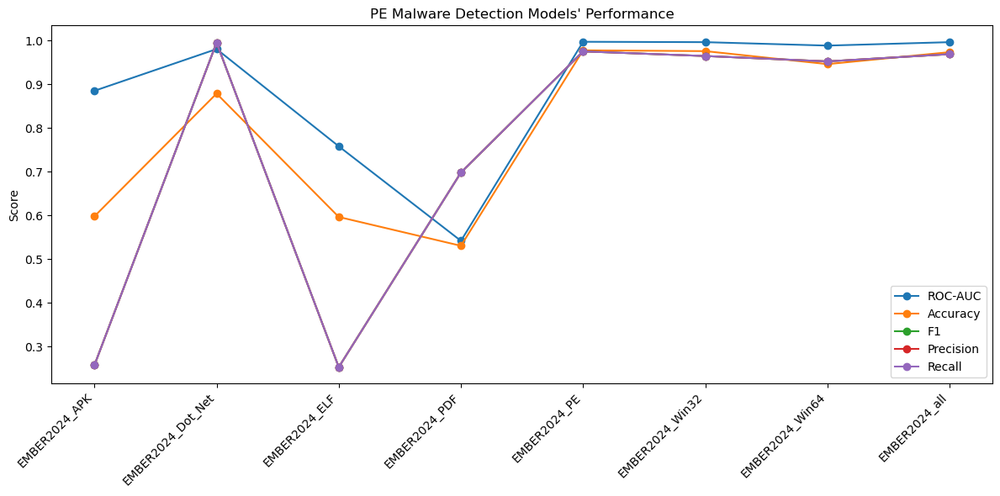

HTML(value='<p style="font-size:24px;">Threshold = 0.6</p>')

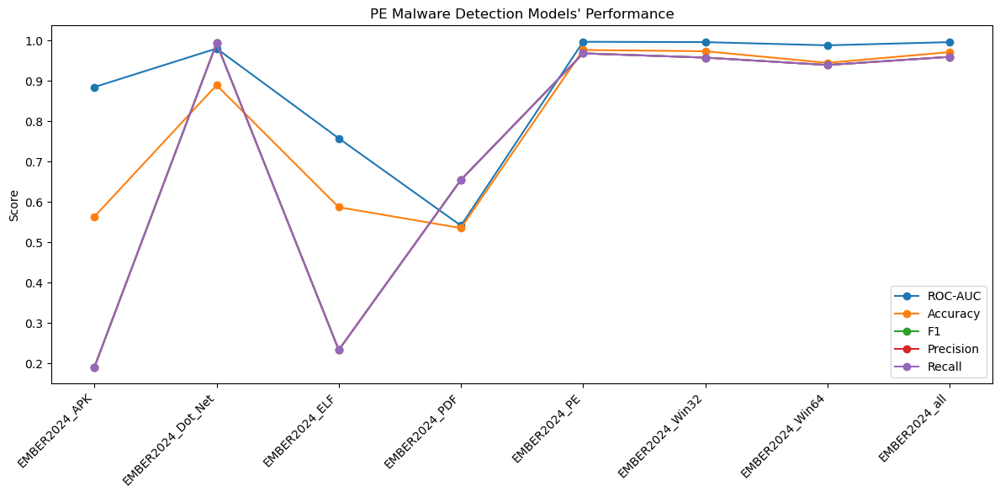

HTML(value='<p style="font-size:24px;">Threshold = 0.7</p>')

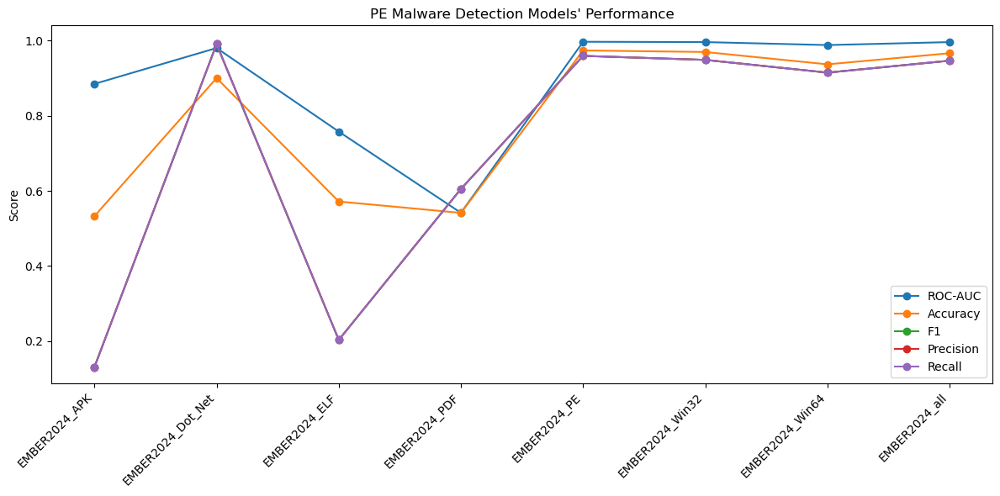

HTML(value='<p style="font-size:24px;">Threshold = 0.8</p>')

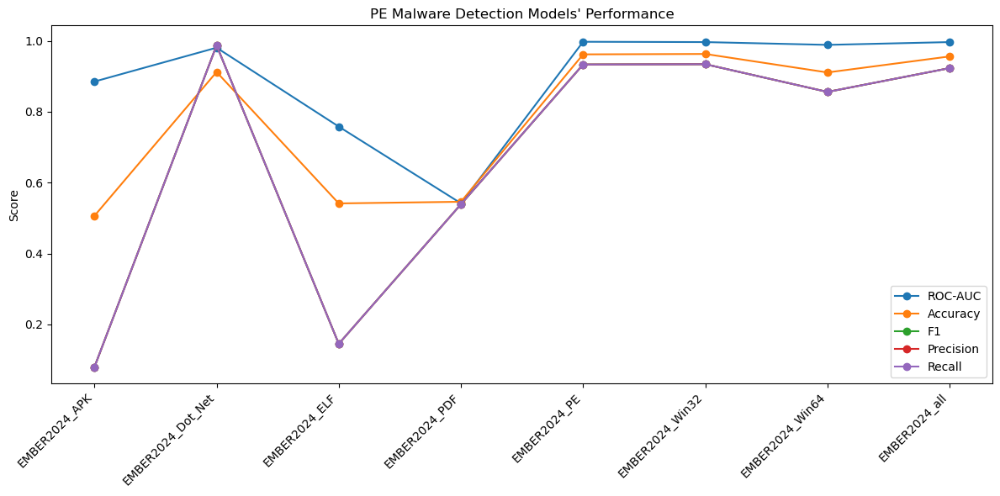

HTML(value='<p style="font-size:24px;">Threshold = 0.85</p>')

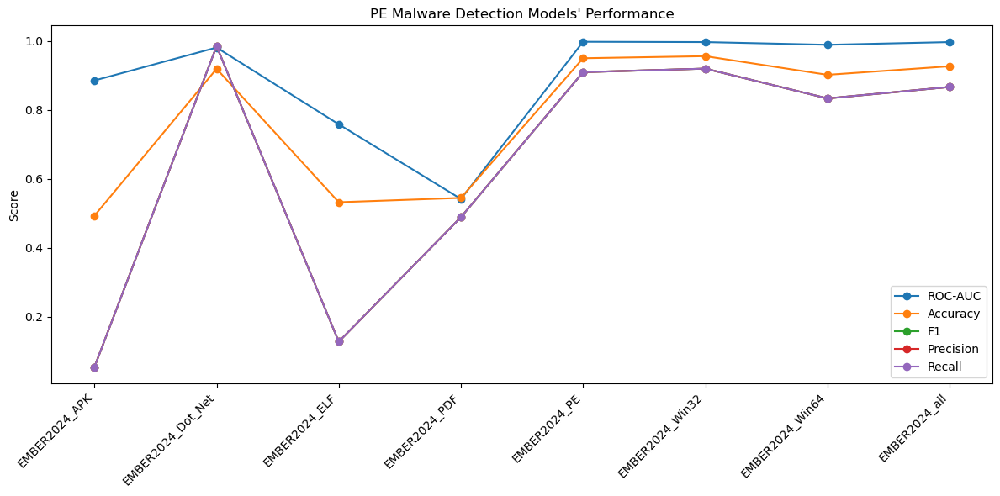

HTML(value='<p style="font-size:24px;">Threshold = 0.9</p>')

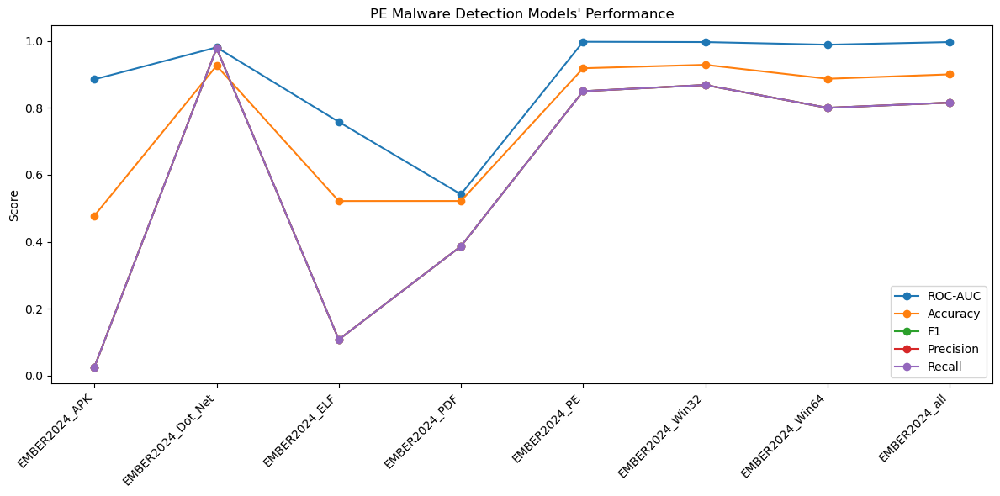

In [6]:
plot_metrics(RESULTS, PLOT_METRICS.ALL)

HTML(value='<p style="font-size:24px;">Threshold = 0.5</p>')

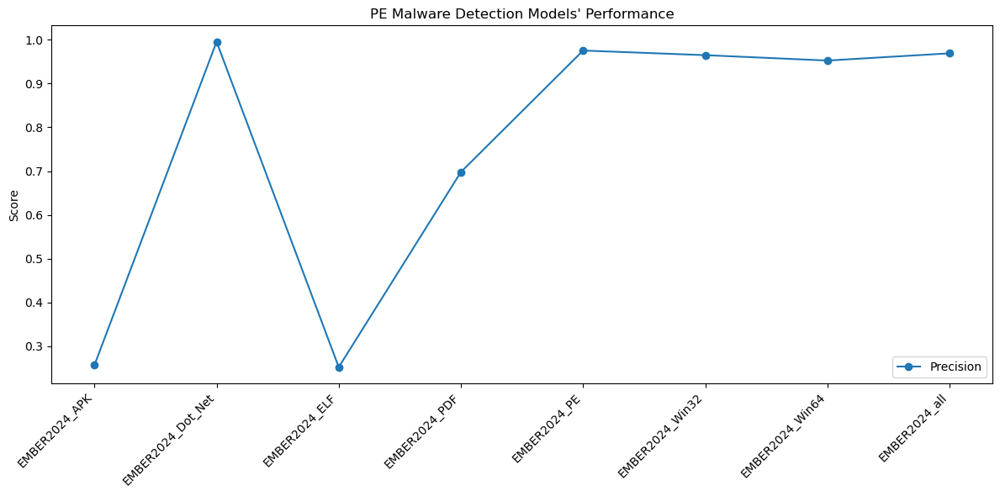

HTML(value='<p style="font-size:24px;">Threshold = 0.6</p>')

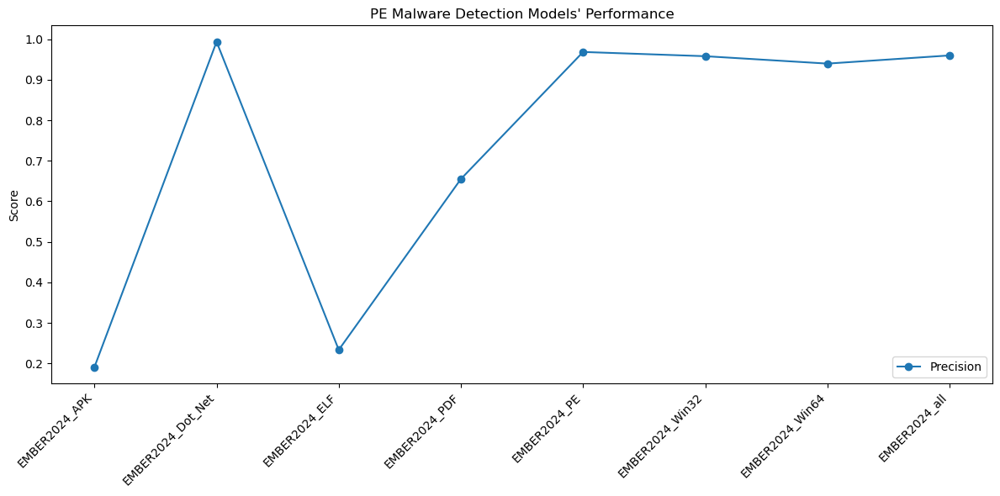

HTML(value='<p style="font-size:24px;">Threshold = 0.7</p>')

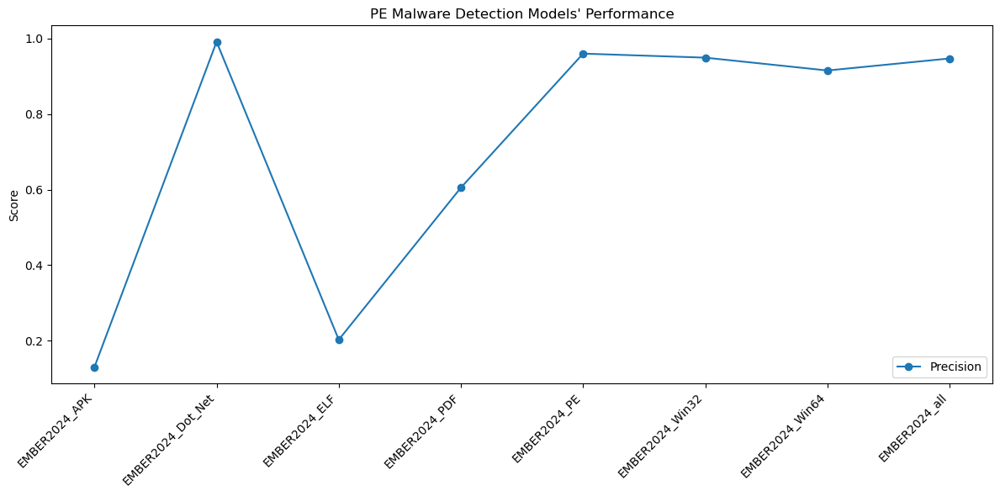

HTML(value='<p style="font-size:24px;">Threshold = 0.8</p>')

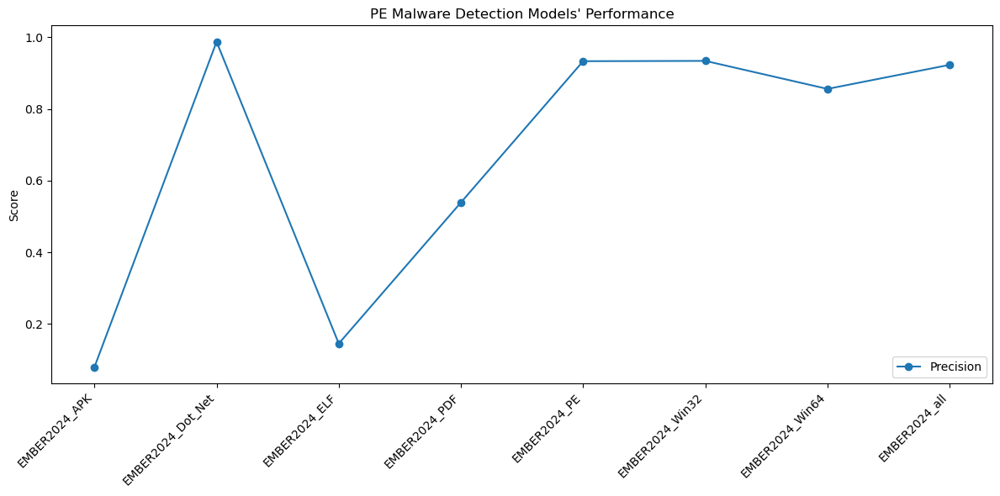

HTML(value='<p style="font-size:24px;">Threshold = 0.85</p>')

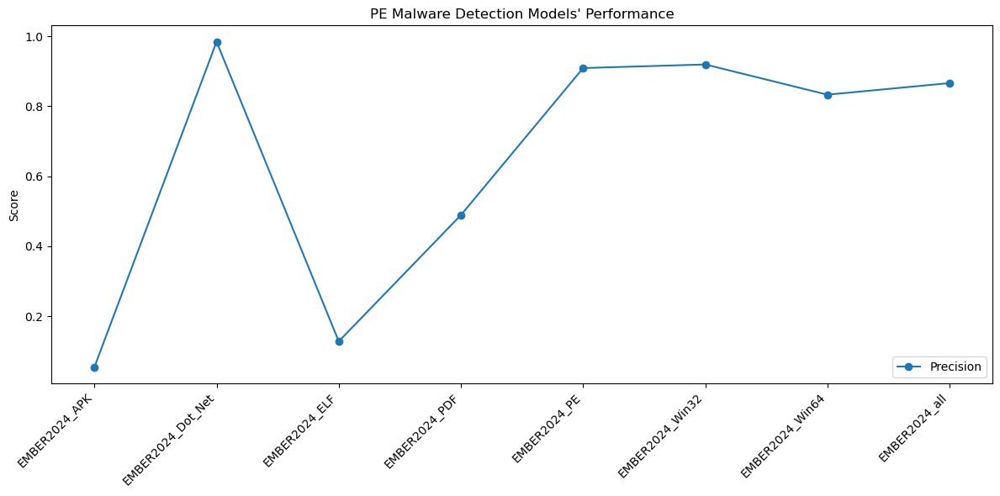

HTML(value='<p style="font-size:24px;">Threshold = 0.9</p>')

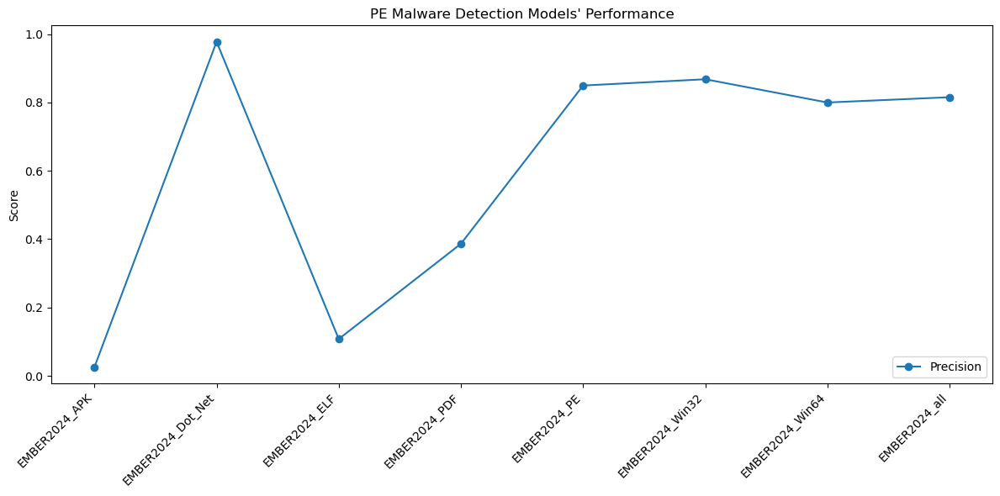

In [7]:
plot_metrics(RESULTS, PLOT_METRICS.PRECISION)

HTML(value='<p style="font-size:24px;">Threshold = 0.5</p>')

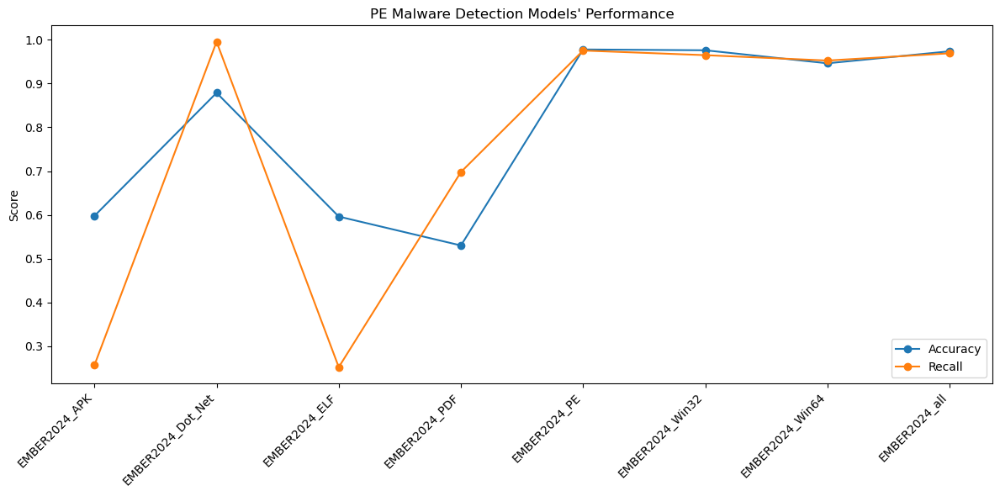

HTML(value='<p style="font-size:24px;">Threshold = 0.6</p>')

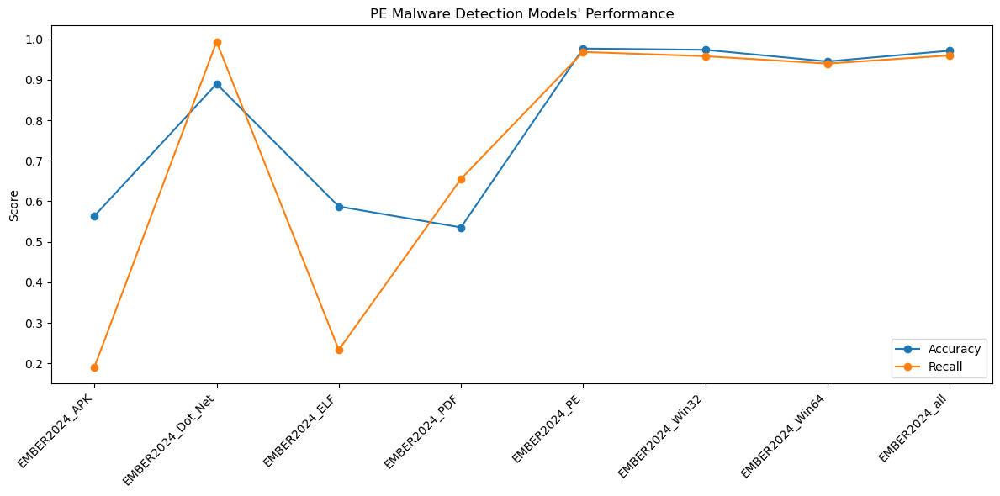

HTML(value='<p style="font-size:24px;">Threshold = 0.7</p>')

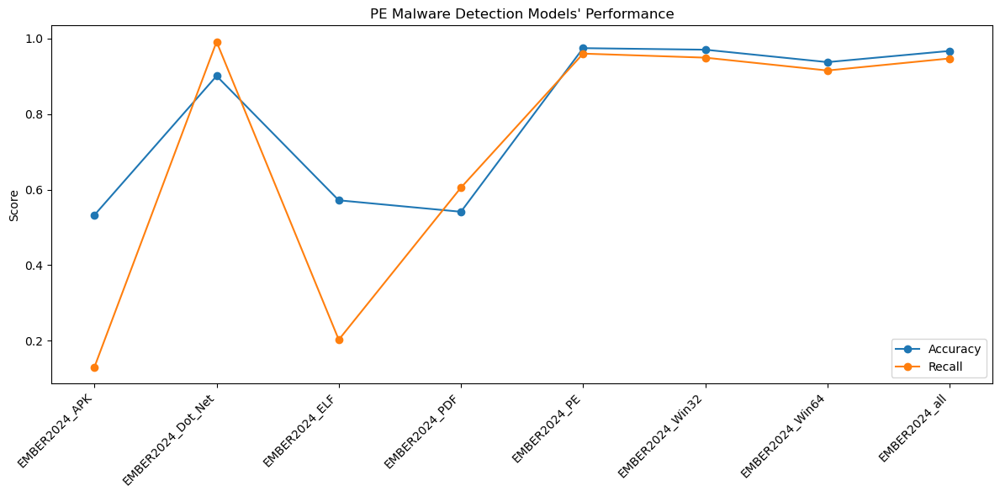

HTML(value='<p style="font-size:24px;">Threshold = 0.8</p>')

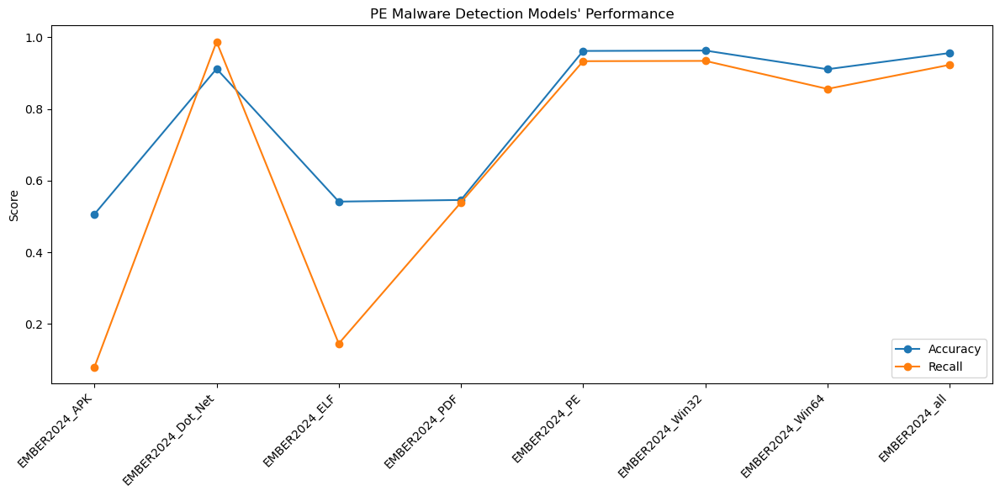

HTML(value='<p style="font-size:24px;">Threshold = 0.85</p>')

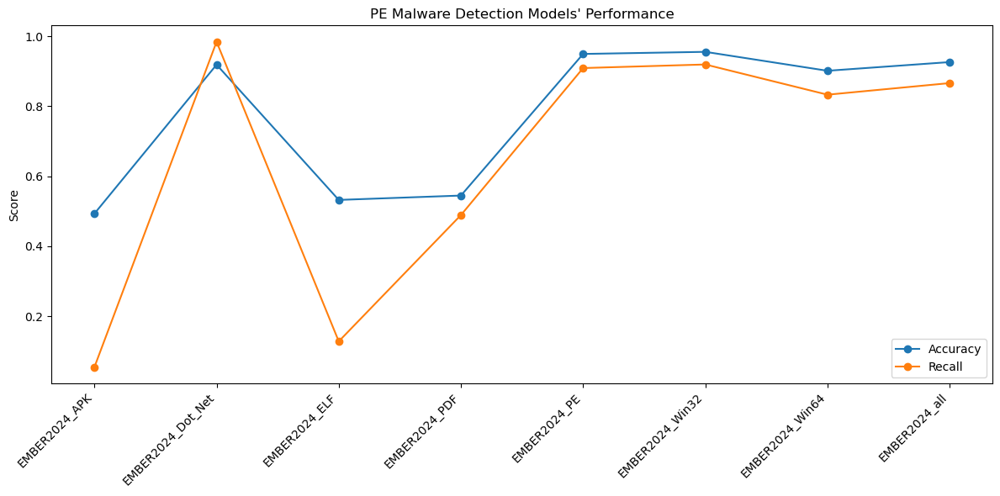

HTML(value='<p style="font-size:24px;">Threshold = 0.9</p>')

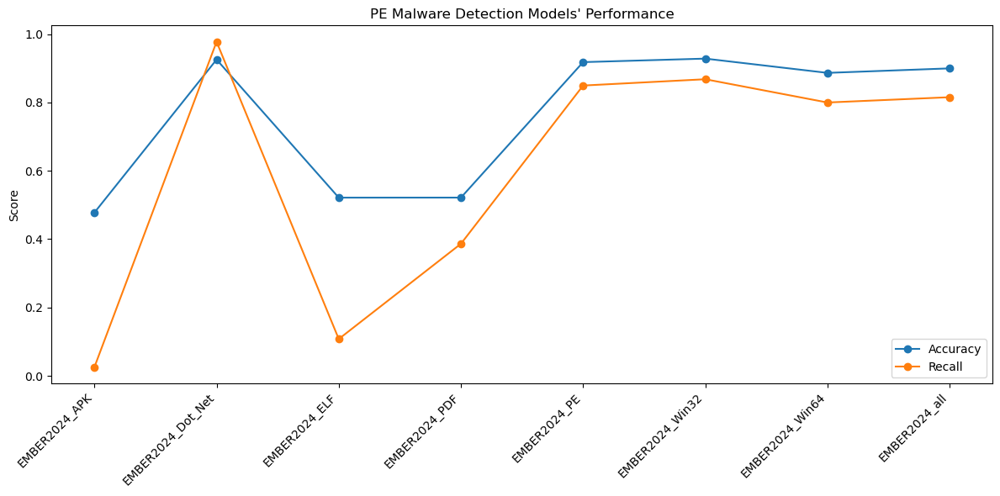

In [8]:
plot_metrics(RESULTS, PLOT_METRICS.ACCURACY | PLOT_METRICS.RECALL)

HTML(value='<p style="font-size:24px;">Threshold = 0.5</p>')

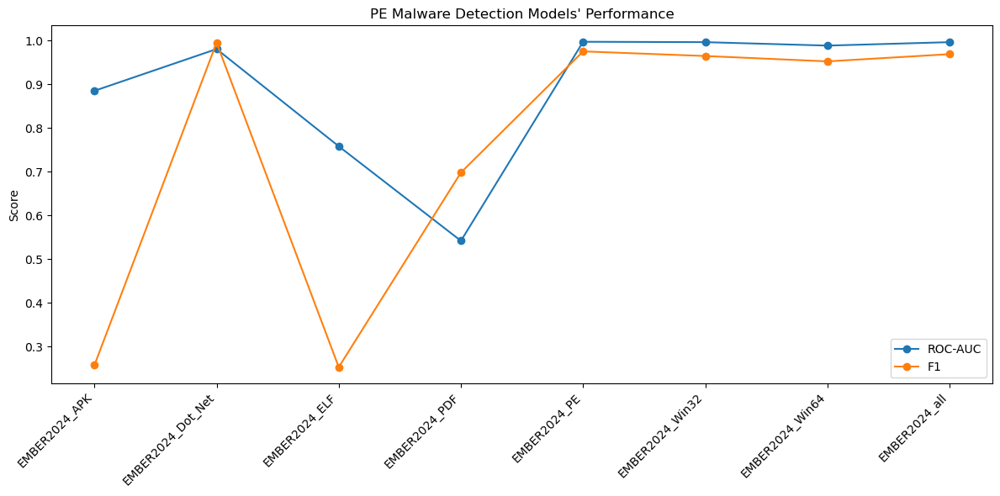

HTML(value='<p style="font-size:24px;">Threshold = 0.6</p>')

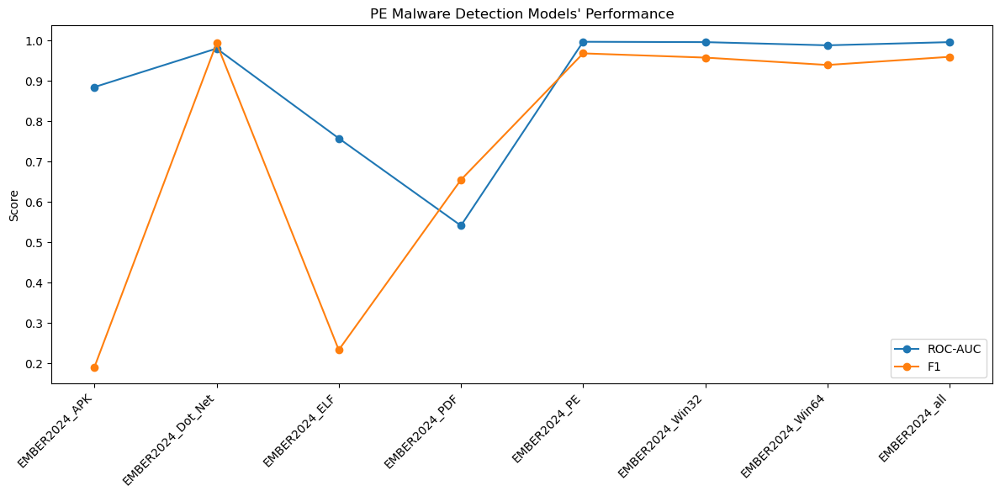

HTML(value='<p style="font-size:24px;">Threshold = 0.7</p>')

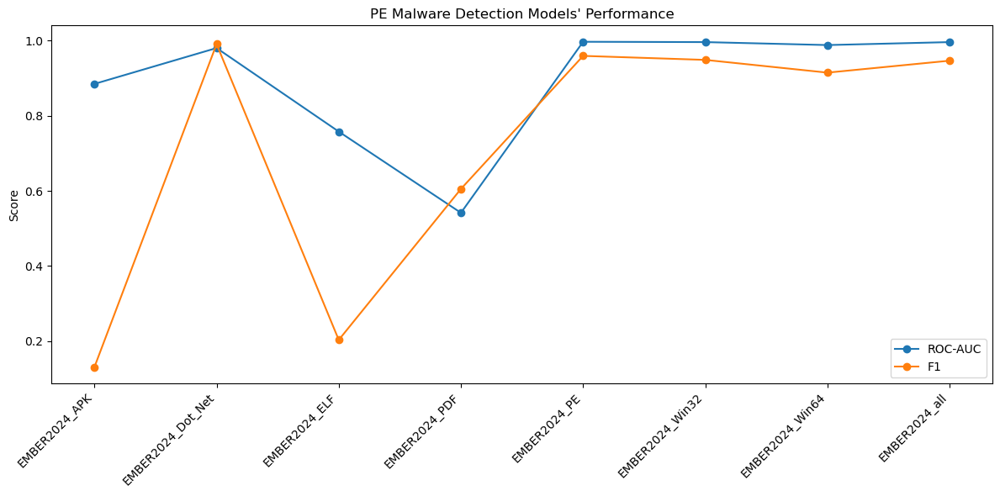

HTML(value='<p style="font-size:24px;">Threshold = 0.8</p>')

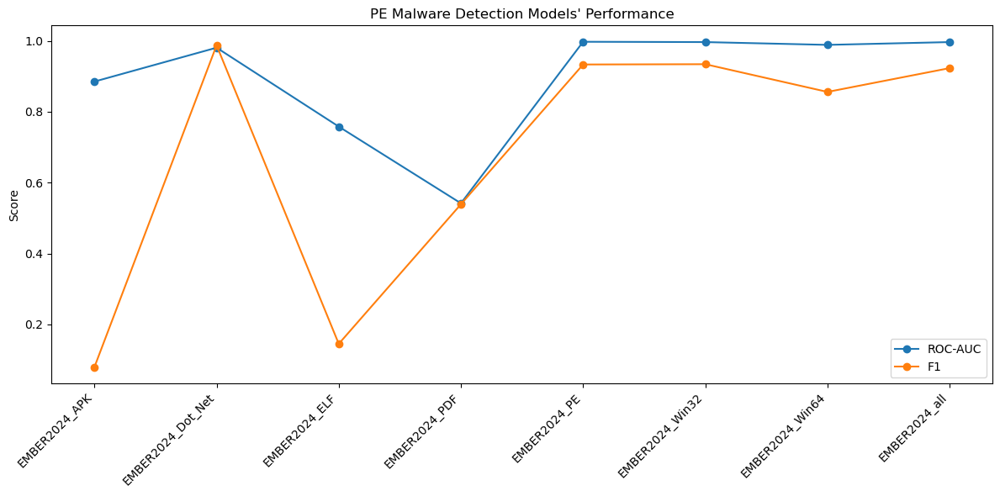

HTML(value='<p style="font-size:24px;">Threshold = 0.85</p>')

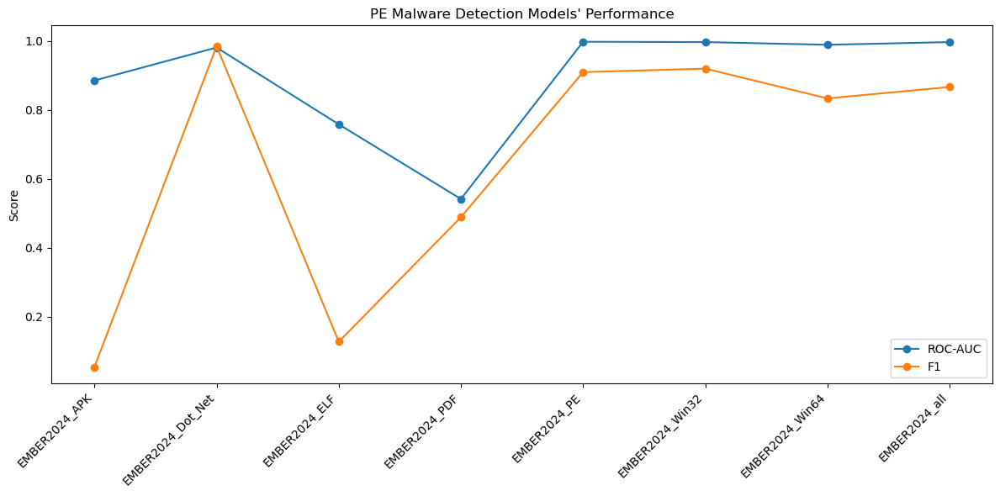

HTML(value='<p style="font-size:24px;">Threshold = 0.9</p>')

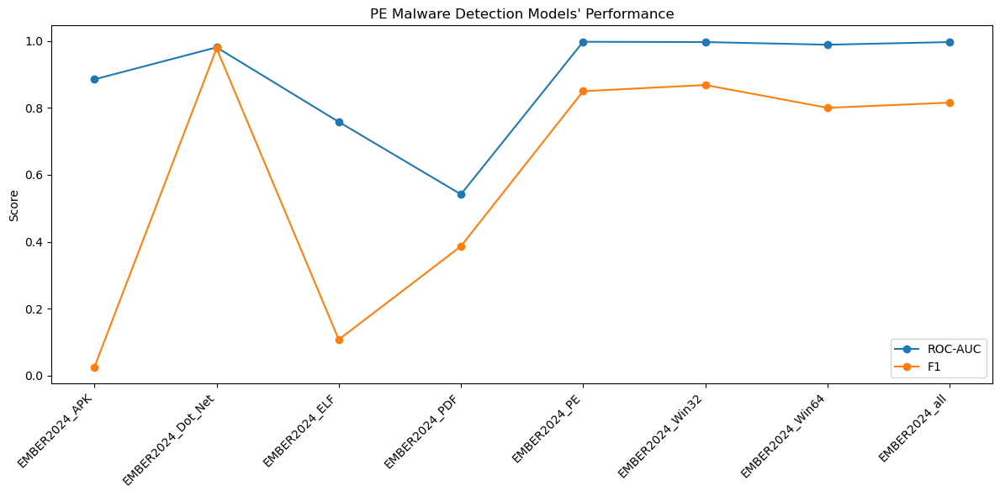

In [9]:
plot_metrics(RESULTS, PLOT_METRICS.F1 | PLOT_METRICS.ROC_AUC)

### c) Displaying pre-rendered ROC, DET curves

In [10]:
display_prerendered_curves(RESULTS)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 147.75it/s]


Accordion(children=(Output(), Output(), Output(), Output(), Output(), Output(), Output(), Output()), titles=('…